## Подготовительная работа
* [Installing a Library Permanently in Colab](https://saturncloud.io/blog/how-to-install-a-library-permanently-in-colab/)

In [1]:
## connect google drive
from google.colab import drive


drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install virtualenv
!virtualenv /content/drive/MyDrive/vkr/kmu/virtual_env

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 15.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.9/468.9 kB 21.8 MB/s eta 0:00:00
created virtual environment CPython3.10.12.final.0-64 in 40702ms
  creator CPython3Posix(dest=/content/drive/MyDrive/vkr/kmu/virtual_env, clear=False, no_vcs_ignore=False, global=False)
  seeder FromAppData(download=False, pip=bundle, setuptools=bundle, wheel=bundle, via=copy, app_data_dir=/root/.local/share/virtualenv)
    added seed packages: Babel==2.14.0, Cython==0.29.37, DAWG_Python==0.7.2, Deprecated==1.2.14, Janome==0.5.0, Jinja2==3.1.3, MarkupSafe==2.1.5, PySocks==1.7.1, PyYAML==6.0.1, Wikipedia_API==0.6.0, affine==2.4.0, aiohttp==3.9.3, aiosignal==1.3.1, alabaster==0.7.16, async_timeout==4.0.3, attrs==23.2.0, autodocsumm==0.2.12, beautifulsoup4==4.12.3, blosc2==2.6.1, boto3==1.34.80, botocore==1.34.80, bpemb==0.3.5, certifi==2024.2.2, charset_normalizer==3.3.2, click==8.1.7, click_plugins==1.1.1, cligj==0.7.2, cloudpi

In [3]:
import sys


venv_path = "/content/drive/MyDrive/vkr/kmu/virtual_env/lib/python3.10/site-packages"
if venv_path not in sys.path:
  # add the path of the virtual environment site-packages to colab system path
  sys.path.append(venv_path)
sys.path

['/content',
 '/env/python',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/content/drive/MyDrive/vkr/kmu/virtual_env/lib/python3.10/site-packages']

## Pandana

```bash
!source /content/drive/MyDrive/vkr/kmu/virtual_env/bin/activate; pip install pyrosm contextily mapclassify osmnx pandana
```

In [ ]:
!source /content/drive/MyDrive/vkr/kmu/virtual_env/bin/activate; pip install pandana

In [ ]:
!pip freeze

### Конфигурация

In [4]:
DIR_OSM = '/content/drive/MyDrive/vkr/kmu/src/osm/'
CITY = 'SanktPetersburg'
#BBOX = [30.2561753, 59.929385, 30.3637657, 59.9832816]
BBOX = [30.2665719, 59.8913232, 30.4101337, 59.9632426]

UTM_ZONE = 32636
MAP_DIST = 50
MAX_DIST = 500
MAX_ITEMS = 10

config = {
    'dir_osm': DIR_OSM,
    'city': CITY,
    'crs': UTM_ZONE,
    'filters': {
        'buildings': {
            'all': {
                'building': True
            },
            'residential_only': {
                'building': [
                'apartments',
                'residential'
              ]
            }
        },
        'POIs': {
            'shop': [
                'convenience',
                'supermarket',
                'mall',
                'greengrocer'
            ],
            'amenity': [
                'pharmacy',
                'university',
                'school',
                'kindergarten',
                'clinic',
                'car_wash'
            ],
            'healthcare': [
                'clinic'
            ]
        },
        'network_type': [
            'walking',
            'driving'
        ]
    },
    'bbox': BBOX,
    'map_dist': MAP_DIST,
    'max_dist': MAX_DIST,
    'max_items': MAX_ITEMS
}

### Логирование

<details>
<summary> Log levels</summary>

```py
logging.debug("A DEBUG Message")
logging.info("An INFO")
logging.warning("A WARNING")
logging.error("An ERROR")
logging.critical("A message of CRITICAL severity")
```
</details>

In [ ]:
!pwd

/content


In [6]:
import logging
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

logger = logging.getLogger()
fhandler = logging.FileHandler(filename=config["dir_osm"]+'obj_assessment_'+start+'.log', mode='w')
logger.addHandler(fhandler)
logger.setLevel(logging.INFO)

### Загрузка подготовленных данных

In [7]:
from geopandas import read_file


fp = ''
network_type = config['filters']['network_type'][0]
#network_type = config['filters']['network_type'][1]

if 'bbox' in config:
  fp = DIR_OSM + 'spb_bbox_' + start + '.gpkg'

  # buildings
  buildings = read_file(fp, layer='buildings')
  if buildings.crs is None:
     logger.info(f'buildings crs is None')

  # pois
  pois = read_file(fp, layer='pois').set_index('id')
  if pois.crs is None:
     logger.info(f'pois crs is None')

  # graph
  nodes = read_file(fp, layer=f'{network_type}_nodes').set_index('id')
  edges = read_file(fp, layer=f'{network_type}_edges')
  if nodes.crs is None:
     logger.info(f'graph crs is None')

  logger.info(f'read buildings/pois/{network_type}_graph from {fp}')

else:
  fp = DIR_OSM + 'spb_'+ start +'.gpkg'

  # buildings
  buildings = read_file(fp, layer='buildings')
  if buildings.crs is None:
     logger.info(f'buildings crs is None')

  # pois
  pois = read_file(fp, layer='pois').set_index('id')
  if pois.crs is None:
     logger.info(f'pois crs is None')

  # graph
  nodes = read_file(fp, layer=f'{network_type}_nodes').set_index('id')
  edges = read_file(fp, layer=f'{network_type}_edges')
  if nodes.crs is None:
     logger.info(f'graph crs is None')

  logger.info(f'read buildings/pois/{network_type}_graph from {fp}')


INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:root:read buildings/pois/walking_graph from /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox_2024_05_06.gpkg


In [8]:
buildings.head(2)

,id,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,geometry
0,22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,"POLYGON ((349578.732 6649376.838, 349577.244 6..."
1,23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,"POLYGON ((355124.500 6646068.154, 355127.464 6..."


In [9]:
pois.head(2)

,pois,pois_cat,name,osm_type,centroid_x,centroid_y,geometry
id,,,,,,,
311101154,pharmacy,pharmacy,У театра,node,348417.017363,6.646147e+06,POINT (348417.017 6646147.340)
311101166,kindergarten,education,Детский сад № 60,node,348459.251380,6.646128e+06,POINT (348459.251 6646128.172)


In [10]:
nodes.head(2)

,x,y,geometry
id,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641)
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545)


In [28]:
nodes.y.min()

6642151.919533828

In [11]:
edges.head(2)

,u,v,length,oneway,highway,geometry
0,10240355599,1591433310,14.247,no,unclassified,"LINESTRING (350768.978 6647816.641, 350769.630..."
1,1591433310,9296451194,24.230,no,unclassified,"LINESTRING (350772.207 6647830.545, 350777.960..."


In [12]:
pois.shape

(1915, 7)

In [20]:
shops = pois[pois.pois_cat == 'shop']
pharmacies = pois[pois.pois_cat == 'pharmacy']
education = pois[pois.pois_cat == 'education']
clinics = pois[pois.pois_cat == 'clinics']
#leisure
custom = pois[pois.pois_cat == 'custom']

logger.info(f'divide pois on categories')

INFO:root:divide pois on categories


### Pandana network

In [21]:
import pandana


is_twoway = True
if network_type == 'driving':
  is_twoway = False

pandana_network = pandana.Network(
    node_x=nodes.x,
    node_y=nodes.y,
    edge_from=edges.u,
    edge_to=edges.v,
    edge_weights=edges[['length']],
    twoway=is_twoway
    )

logger.info(f'create pandana {network_type} network')

INFO:root:create pandana walking network


### Accessibility

In [22]:
def get_nodes(obj, category, map_dist=50):
  node_id = pandana_network.get_node_ids(
    x_col=obj.centroid_x,
    y_col=obj.centroid_y,
    mapping_distance=map_dist
    )
  logger.info(f'map {category} centroids and nodes of {network_type} network')
  return node_id
  #return node_id.astype(int, copy=True)

In [23]:
buildings['node_id'] = get_nodes(buildings, 'buildings', config['map_dist'])
shops['node_id'] = get_nodes(shops, 'shops', config['map_dist'])
pharmacies['node_id'] = get_nodes(pharmacies, 'pharmacies', config['map_dist'])
education['node_id'] = get_nodes(education, 'education', config['map_dist'])
clinics['node_id'] = get_nodes(clinics, 'clinics', config['map_dist'])
#leisure
custom['node_id'] = get_nodes(custom, 'custom', config['map_dist'])

INFO:root:map buildings centroids and nodes of walking network
INFO:root:map shops centroids and nodes of walking network
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
INFO:root:map pharmacies centroids and nodes of walking network
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
INFO:root:map education ce

In [24]:
buildings = buildings.dropna(subset=["node_id"])
shops = shops.dropna(subset=["node_id"])
pharmacies = pharmacies.dropna(subset=["node_id"])
education = education.dropna(subset=["node_id"])
clinics = clinics.dropna(subset=["node_id"])
#leisure
custom = custom.dropna(subset=["node_id"])

logger.info(f'drop unmapped buildings and pois')

INFO:root:drop unmapped buildings and pois


<ipython-input-81-a1f9ebc22f0f>:16: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
INFO:root:save map buildings to /content/drive/MyDrive/vkr/kmu/src/osm/images/map_buildings_centroids_and_nodes_of_walking_network_2024_05_06.png


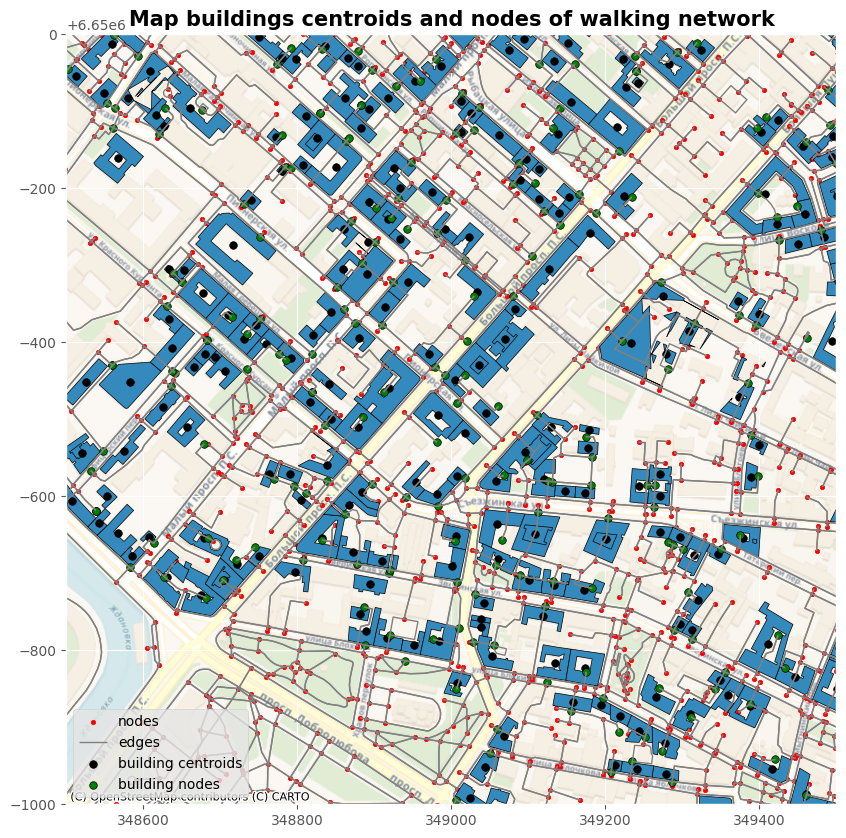

In [81]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = nodes.plot(figsize=(20, 10), label='nodes', color='red', markersize=10, alpha=1)
  ax = edges.plot(ax=ax, label='edges', color='gray', linewidth=1, alpha=1)

  ax = buildings.plot(ax=ax, label='buildings', edgecolor='black', alpha=1)
  ax = buildings.centroid.plot(ax=ax, label='building centroids', color='black', edgecolor='black', markersize=30)
  ax = nodes.loc[buildings.node_id.astype(int)].plot(ax=ax, label='building nodes', color='green', edgecolor='black', markersize=30)
  plt.setp(ax, xlim=(348500, 349500), ylim=(6649000, 6650000))

  plt.legend()
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Map buildings centroids and nodes of {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/map_buildings_centroids_and_nodes_of_{network_type}_network_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save map buildings to {fp}')
  plt.show()

<ipython-input-82-5840fa74d7e7>:16: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
INFO:root:save map buildings to /content/drive/MyDrive/vkr/kmu/src/osm/images/map_buildings_centroids_and_nodes_of_walking_network_zoom_2024_05_06.png


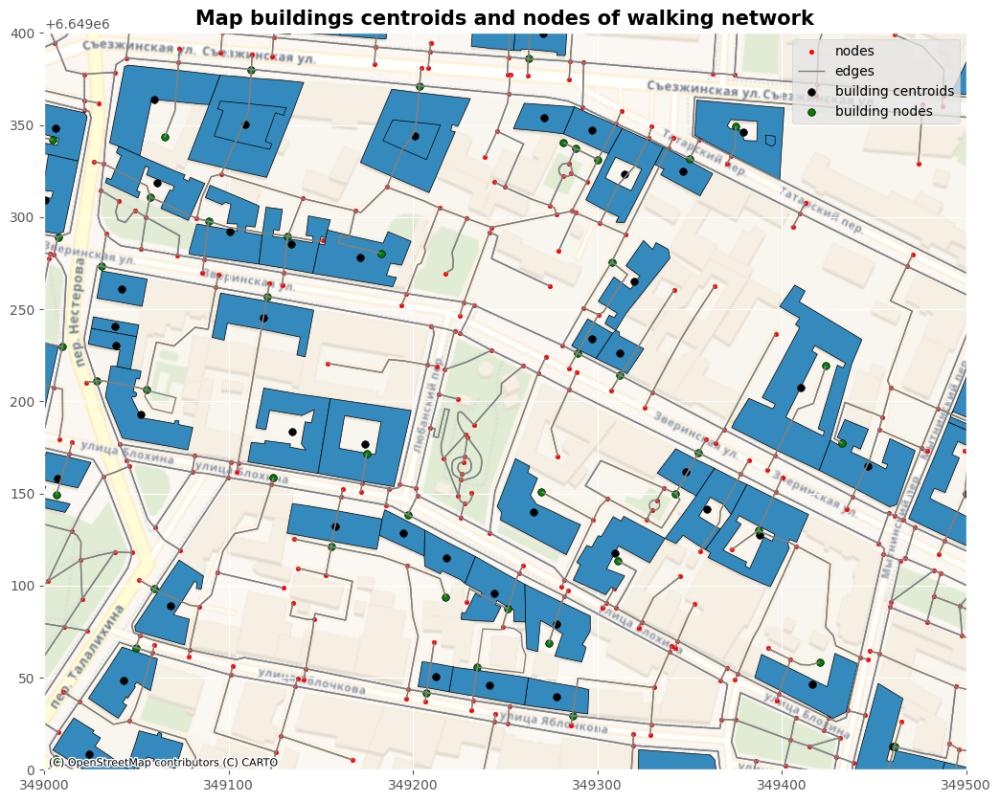

In [82]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = nodes.plot(figsize=(20, 10), label='nodes', color='red', markersize=10, alpha=1)
  ax = edges.plot(ax=ax, label='edges', color='gray', linewidth=1, alpha=1)

  ax = buildings.plot(ax=ax, label='buildings', edgecolor='black', alpha=1)
  ax = buildings.centroid.plot(ax=ax, label='building centroids', color='black', edgecolor='black', markersize=30)
  ax = nodes.loc[buildings.node_id.astype(int)].plot(ax=ax, label='building nodes', color='green', edgecolor='black', markersize=30)
  plt.setp(ax, xlim=(349000, 349500), ylim=(6649000, 6649400))

  plt.legend()
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Map buildings centroids and nodes of {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/map_buildings_centroids_and_nodes_of_{network_type}_network_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save map buildings to {fp}')
  plt.show()

In [31]:
pandana_network.set(node_ids=buildings['node_id'], name='buildings')
pandana_network.set(node_ids=shops['node_id'], name='shops')
pandana_network.set(node_ids=pharmacies['node_id'], name='pharmacies')
pandana_network.set(node_ids=education['node_id'], name='education')
pandana_network.set(node_ids=clinics['node_id'], name='clinics')
#leisure
pandana_network.set(node_ids=custom['node_id'], name='custom')

logger.info(f'set variable_name to node groups')

INFO:root:set variable_name to node groups


In [32]:
pandana_network.variable_names

{'buildings', 'clinics', 'custom', 'education', 'pharmacies', 'shops'}

In [33]:
def calculate_accessibility(dist, aggr_type, decay, name):
  accessibility = pandana_network.aggregate(
    distance=dist,
    type=aggr_type,
    decay=decay,
    imp_name=None,
    name=name,
    )
  logger.info(f'calculate amount of {name} within {dist}m')
  return accessibility

In [34]:
shops_access = calculate_accessibility(dist=500, aggr_type='count', decay='linear', name='shops')
pharmacies_access = calculate_accessibility(dist=500, aggr_type='count', decay='linear', name='pharmacies')
education_access = calculate_accessibility(dist=500, aggr_type='count', decay='linear', name='education')
clinics_access = calculate_accessibility(dist=500, aggr_type='count', decay='linear', name='clinics')
#leisure
custom_access = calculate_accessibility(dist=500, aggr_type='count', decay='linear', name='custom')

INFO:root:calculate amount of shops within 500m
INFO:root:calculate amount of pharmacies within 500m
INFO:root:calculate amount of education within 500m
INFO:root:calculate amount of clinics within 500m
INFO:root:calculate amount of custom within 500m


In [35]:
shops_access.head(2)

id
10240355599    4.0
1591433310     4.0
dtype: float64

In [36]:
shops_access.name = 'shops_access'
pharmacies_access.name = 'pharmacies_access'
education_access.name = 'schools_access'
clinics_access.name = 'clinics_access'
#leisure
custom_access.name = 'custom_access'

In [38]:
shops_access_norm = (shops_access - shops_access.min()) / (shops_access.max() - shops_access.min())
pharmacies_access_norm = (pharmacies_access - pharmacies_access.min()) / (pharmacies_access.max() - pharmacies_access.min())
education_access_norm = (education_access - education_access.min()) / (education_access.max() - education_access.min())
clinics_access_norm = (clinics_access - clinics_access.min()) / (clinics_access.max() - clinics_access.min())
#leisure
custom_access_norm = (custom_access - custom_access.min()) / (custom_access.max() - custom_access.min())

logger.info(f'linear normalization of accessibility')

INFO:root:linear normalization of accessibility


In [39]:
nodes = nodes.merge(shops_access_norm, right_index=True, left_index=True)
nodes = nodes.merge(pharmacies_access_norm, right_index=True, left_index=True)
nodes = nodes.merge(education_access_norm, right_index=True, left_index=True)
nodes = nodes.merge(clinics_access_norm, right_index=True, left_index=True)
#leisure
nodes = nodes.merge(custom_access_norm, right_index=True, left_index=True)

logger.info(f'add accessibility to nodes')

INFO:root:add accessibility to nodes


In [40]:
nodes.head(2)

,x,y,geometry,shops_access,pharmacies_access,schools_access,clinics_access,custom_access
id,,,,,,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641),0.108108,0.043478,0.333333,0.176471,0.333333
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545),0.108108,0.043478,0.333333,0.176471,0.333333


In [41]:
from pandas import Series

K = 5

nodes['access_sum'] = nodes.iloc[:,3:8].sum(axis=1)
logger.info(f'add access_sum to nodes')
nodes['k_div_access'] = [sum([1/K for _, col in row.items() if col > 0.0]) for _, row in nodes.iloc[:,3:8].iterrows()]
logger.info(f'add k_div_access to nodes')

INFO:root:add access_sum to nodes
INFO:root:add k_div_access to nodes


In [42]:
nodes.head(2)

,x,y,geometry,shops_access,pharmacies_access,schools_access,clinics_access,custom_access,access_sum,k_div_access
id,,,,,,,,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641),0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545),0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0


### Proximity

In [44]:
def set_pois(pois, category, maxdist, maxitems):
  pandana_network.set_pois(
    category=category,
    maxdist=maxdist,
    maxitems=maxitems,
    x_col=pois.centroid_x,
    y_col=pois.centroid_y
    )
  logger.info(f'map {category} centroids and nodes of {network_type} network')

In [45]:
set_pois(shops, 'shops', config['max_dist'], config['max_items'])
set_pois(pharmacies, 'pharmacies', config['max_dist'], config['max_items'])
set_pois(education, 'education', config['max_dist'], config['max_items'])
set_pois(clinics, 'clinics', config['max_dist'], config['max_items'])
#leisure
set_pois(custom, 'custom', config['max_dist'], config['max_items'])

INFO:root:map shops centroids and nodes of walking network
INFO:root:map pharmacies centroids and nodes of walking network
INFO:root:map education centroids and nodes of walking network
INFO:root:map clinics centroids and nodes of walking network
INFO:root:map custom centroids and nodes of walking network


In [46]:
def calculate_proximity(category, maxdist, num_pois, include_poi=False):
  columns = {(i+1):f'nearest_{category}_{i+1}' for i in range(num_pois)}
  logger.debug(columns)

  distances = pandana_network.nearest_pois(
    distance=maxdist,
    category=category,
    num_pois=num_pois,
    include_poi_ids=include_poi
  ).rename(columns=columns)
  logger.info(f'calculate distance to {num_pois} nearest {category} within {maxdist}m')
  return distances

In [47]:
shop_dist = calculate_proximity('shops', config['max_dist'], 1)
pharmacies_dist = calculate_proximity('pharmacies', config['max_dist'], 1)
education_dist = calculate_proximity('education', config['max_dist'], 1)
clinics_dist = calculate_proximity('clinics', config['max_dist'], 1)
#leisure
custom_dist = calculate_proximity('custom', config['max_dist'], 1)

INFO:root:calculate distance to 1 nearest shops within 500m
INFO:root:calculate distance to 1 nearest pharmacies within 500m
INFO:root:calculate distance to 1 nearest education within 500m
INFO:root:calculate distance to 1 nearest clinics within 500m
INFO:root:calculate distance to 1 nearest custom within 500m


In [48]:
shop_prox = 1 - ((shop_dist - shop_dist.min()) / (shop_dist.max() - shop_dist.min()))
pharmacies_prox = 1 - ((pharmacies_dist - pharmacies_dist.min()) / (pharmacies_dist.max() - pharmacies_dist.min()))
education_prox = 1 - ((education_dist - education_dist.min()) / (education_dist.max() - education_dist.min()))
clinics_prox = 1 - ((clinics_dist - clinics_dist.min()) / (clinics_dist.max() - clinics_dist.min()))
#leisure
custom_prox = 1 - ((custom_dist - custom_dist.min()) / (custom_dist.max() - custom_dist.min()))

logger.info(f'linear normalization and reverse of proximity')

INFO:root:linear normalization and reverse of proximity


In [49]:
nodes = nodes.merge(shop_prox, right_index=True, left_index=True)
nodes = nodes.merge(pharmacies_prox, right_index=True, left_index=True)
nodes = nodes.merge(education_prox, right_index=True, left_index=True)
nodes = nodes.merge(clinics_prox, right_index=True, left_index=True)
nodes = nodes.merge(custom_prox, right_index=True, left_index=True)

logger.info(f'add proximity to nodes')

INFO:root:add proximity to nodes


In [50]:
nodes['prox_sum'] = nodes.iloc[:,10:15].sum(axis=1)
logger.info(f'add prox_sum to nodes')

INFO:root:add prox_sum to nodes


In [51]:
nodes.head(2)

,x,y,geometry,shops_access,pharmacies_access,schools_access,clinics_access,custom_access,access_sum,k_div_access,nearest_shops_1,nearest_pharmacies_1,nearest_education_1,nearest_clinics_1,nearest_custom_1,prox_sum
id,,,,,,,,,,,,,,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641),0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0,0.385186,0.385186,0.810030,0.271316,0.552094,2.403812
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545),0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0,0.413680,0.413680,0.838524,0.299810,0.580588,2.546282


In [52]:
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

fp = ''
if 'bbox' in config:
  fp = config['dir_osm'] + 'spb_bbox_' + start + '.gpkg'
  nodes.to_file(fp, driver='GPKG', layer=f'{network_type}_nodes_with_objective_metrics', encoding='utf-8')
  logger.info(f'save {network_type} nodes with objective metrics to {fp}')
else:
  fp = config['dir_osm'] + 'spb_' + start + '.gpkg'
  nodes.to_file(fp, driver='GPKG', layer=f'{network_type}_nodes_with_objective_metrics', encoding='utf-8')
  logger.info(f'save {network_type} nodes with objective metrics to {fp}')

INFO:root:save walking nodes with objective metrics to /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox_2024_05_06.gpkg


In [53]:
from geopandas import read_file


nodes_from_gpkg = read_file(fp, layer=f'{network_type}_nodes_with_objective_metrics').set_index('id')

if nodes.shape[0] == nodes_from_gpkg.shape[0] and nodes.crs == nodes_from_gpkg.crs:
  logger.info(f'{network_type} nodes with objective metrics successfully loaded from gpkg')

INFO:root:walking nodes with objective metrics successfully loaded from gpkg


In [54]:
nodes_from_gpkg.head(2)

,x,y,shops_access,pharmacies_access,schools_access,clinics_access,custom_access,access_sum,k_div_access,nearest_shops_1,nearest_pharmacies_1,nearest_education_1,nearest_clinics_1,nearest_custom_1,prox_sum,geometry
id,,,,,,,,,,,,,,,,
10240355599,350768.977867,6.647817e+06,0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0,0.385186,0.385186,0.810030,0.271316,0.552094,2.403812,POINT (350768.978 6647816.641)
1591433310,350772.206656,6.647831e+06,0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0,0.413680,0.413680,0.838524,0.299810,0.580588,2.546282,POINT (350772.207 6647830.545)


### Add objective metrics to buildings

In [55]:
nodes.head(2)

,x,y,geometry,shops_access,pharmacies_access,schools_access,clinics_access,custom_access,access_sum,k_div_access,nearest_shops_1,nearest_pharmacies_1,nearest_education_1,nearest_clinics_1,nearest_custom_1,prox_sum
id,,,,,,,,,,,,,,,,
10240355599,350768.977867,6.647817e+06,POINT (350768.978 6647816.641),0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0,0.385186,0.385186,0.810030,0.271316,0.552094,2.403812
1591433310,350772.206656,6.647831e+06,POINT (350772.207 6647830.545),0.108108,0.043478,0.333333,0.176471,0.333333,0.994724,1.0,0.413680,0.413680,0.838524,0.299810,0.580588,2.546282


In [56]:
buildings_with_obj_metrics = buildings.merge(nodes.reset_index().rename(columns={'id':'node_id'})[['node_id', 'access_sum', 'k_div_access']], left_on='node_id', right_on='node_id')
logger.info(f'create buildings df with objective metric')

INFO:root:create buildings df with objective metric


In [57]:
buildings_with_obj_metrics.node_id.value_counts()

node_id
6.214704e+09    4
3.811294e+09    4
9.680732e+09    3
7.179454e+09    3
4.897710e+09    3
               ..
1.054184e+10    1
1.054185e+10    1
3.815861e+09    1
3.815861e+09    1
1.176372e+10    1
Name: count, Length: 2904, dtype: int64

In [58]:
buildings_with_obj_metrics.head(2)

,id,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,geometry,node_id,access_sum,k_div_access
0,22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,"POLYGON ((349578.732 6649376.838, 349577.244 6...",1.058809e+10,1.451756,0.8
1,23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,"POLYGON ((355124.500 6646068.154, 355127.464 6...",2.162657e+07,0.450850,0.8


In [59]:
buildings_with_obj_metrics['accessibility'] = buildings_with_obj_metrics.access_sum * buildings_with_obj_metrics.k_div_access
logger.info(f'add accessibility to buildings_with_obj_metrics')

INFO:root:add accessibility to buildings_with_obj_metrics


In [60]:
buildings_with_obj_metrics.head(2)

,id,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,geometry,node_id,access_sum,k_div_access,accessibility
0,22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,"POLYGON ((349578.732 6649376.838, 349577.244 6...",1.058809e+10,1.451756,0.8,1.161405
1,23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,"POLYGON ((355124.500 6646068.154, 355127.464 6...",2.162657e+07,0.450850,0.8,0.360680


In [61]:
buildings_with_obj_metrics = buildings_with_obj_metrics.merge(nodes.reset_index().rename(columns={'id':'node_id'})[['node_id', 'prox_sum']], left_on='node_id', right_on='node_id')
logger.info(f'add proximity to buildings_with_obj_metrics')

INFO:root:add proximity to buildings_with_obj_metrics


In [62]:
buildings_with_obj_metrics = buildings_with_obj_metrics.rename(columns={'prox_sum':'proximity'})

In [63]:
buildings_with_obj_metrics.head(2)

,id,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,geometry,node_id,access_sum,k_div_access,accessibility,proximity
0,22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,"POLYGON ((349578.732 6649376.838, 349577.244 6...",1.058809e+10,1.451756,0.8,1.161405,2.593460
1,23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,"POLYGON ((355124.500 6646068.154, 355127.464 6...",2.162657e+07,0.450850,0.8,0.360680,2.103516


In [64]:
buildings_with_obj_metrics["obj"] = buildings_with_obj_metrics.accessibility + buildings_with_obj_metrics.proximity
logger.info(f'add objective indicator to buildings_with_obj_metrics')

INFO:root:add objective indicator to buildings_with_obj_metrics


In [65]:
buildings_with_obj_metrics.head(2)

,id,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,geometry,node_id,access_sum,k_div_access,accessibility,proximity,obj
0,22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,"POLYGON ((349578.732 6649376.838, 349577.244 6...",1.058809e+10,1.451756,0.8,1.161405,2.593460,3.754865
1,23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,"POLYGON ((355124.500 6646068.154, 355127.464 6...",2.162657e+07,0.450850,0.8,0.360680,2.103516,2.464196


INFO:root:save buildings with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_accessibility_via_walking_network_2024_05_06.png


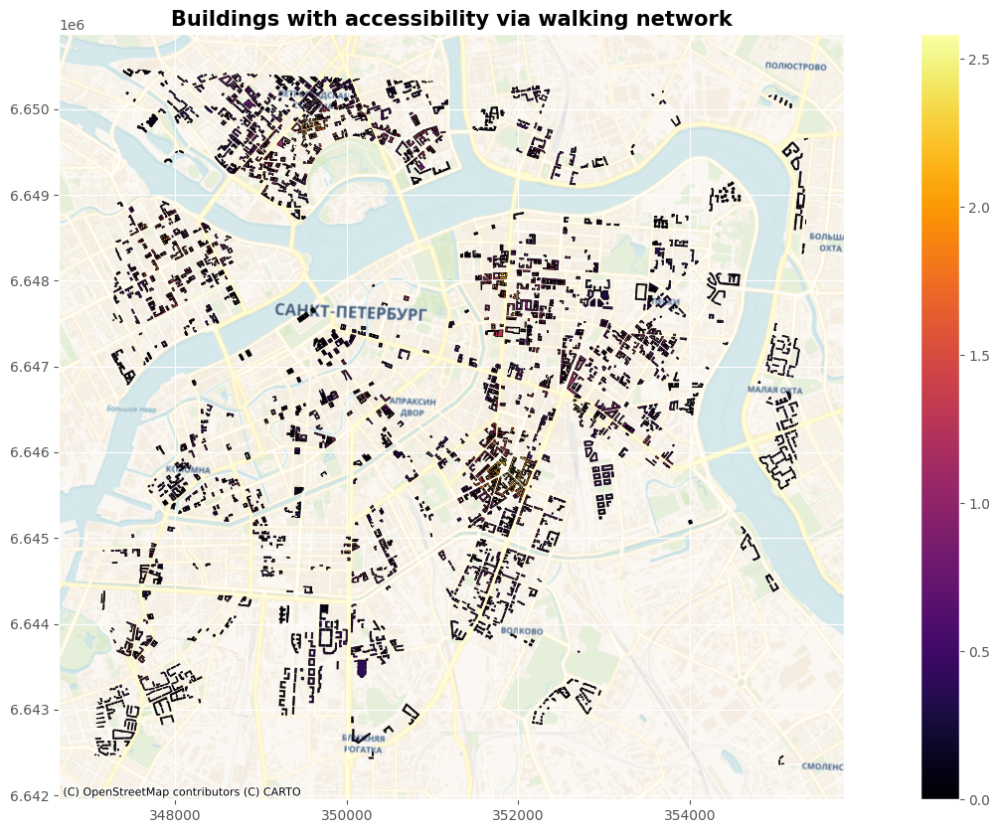

In [83]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='accessibility', legend=True, edgecolor='black', alpha=1, cmap='inferno')
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with accessibility via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_accessibility_via_{network_type}_network_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with accessibility to {fp}')
  plt.show()

INFO:root:save buildings with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_accessibility_via_walking_network_zoom_2024_05_06.png


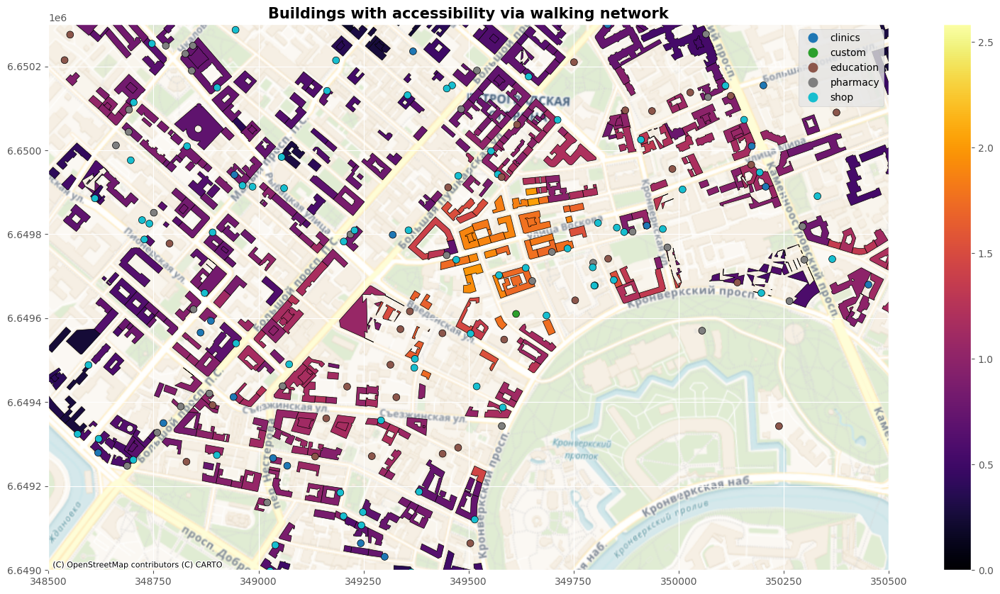

In [86]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='accessibility', legend=True, edgecolor='black', alpha=1, cmap='inferno')
  ax = pois.plot(ax=ax, column='pois_cat', legend=True, markersize=50, edgecolor='black')
  plt.setp(ax, xlim=(348500, 350500), ylim=(6649000, 6650300))
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with accessibility via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_accessibility_via_{network_type}_network_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with accessibility to {fp}')
  plt.show()

INFO:root:save buildings with accessibility to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_accessibility_via_walking_network_zoom_extra_2024_05_06.png


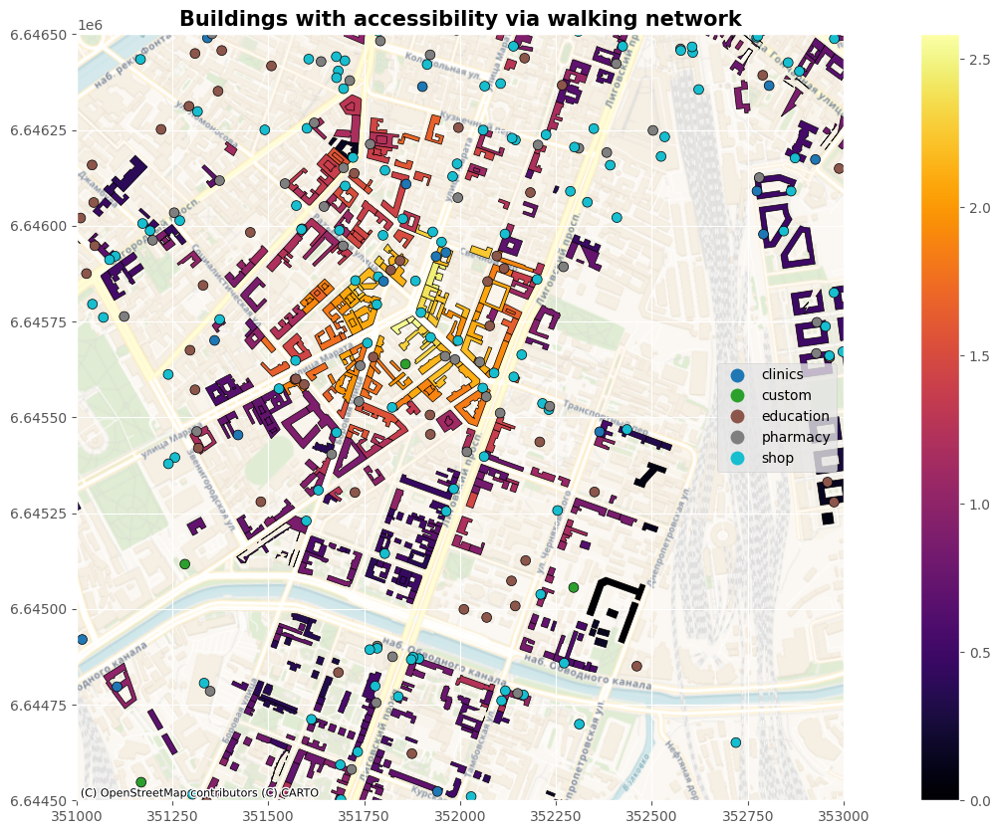

In [87]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='accessibility', legend=True, edgecolor='black', alpha=1, cmap='inferno')
  ax = pois.plot(ax=ax, column='pois_cat', legend=True, markersize=50, edgecolor='black')
  plt.setp(ax, xlim=(351000, 353000), ylim=(6644500, 6646500))
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with accessibility via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_accessibility_via_{network_type}_network_zoom_extra_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with accessibility to {fp}')
  plt.show()

INFO:root:save buildings with proximity to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_proximity_via_walking_network_2024_05_06.png


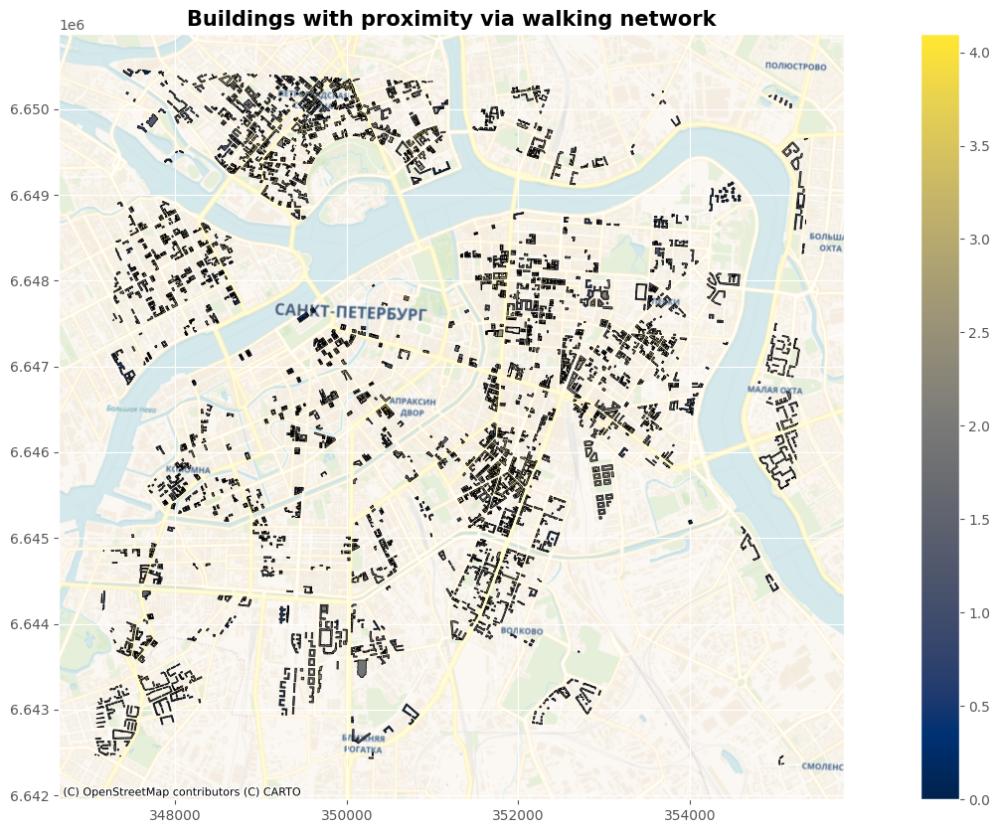

In [89]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='proximity', legend=True, edgecolor='black', alpha=1, cmap='cividis')
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with proximity via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_proximity_via_{network_type}_network_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with proximity to {fp}')
  plt.show()

INFO:root:save buildings with proximity to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_proximity_via_walking_network_zoom_2024_05_06.png


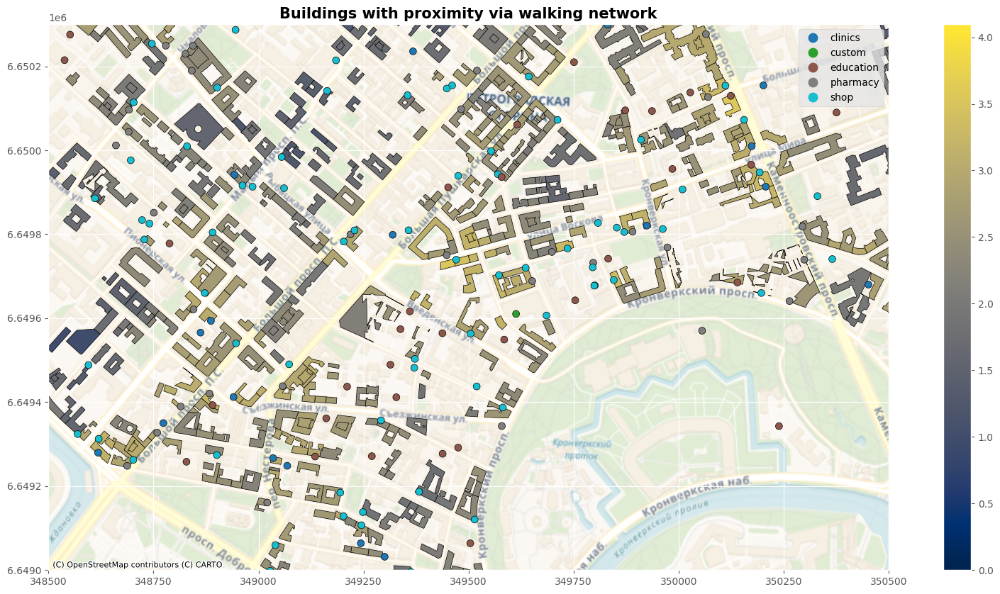

In [91]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='proximity', legend=True, edgecolor='black', alpha=1, cmap='cividis')
  ax = pois.plot(ax=ax, column='pois_cat', legend=True, markersize=50, edgecolor='black')
  plt.setp(ax, xlim=(348500, 350500), ylim=(6649000, 6650300))
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with proximity via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_proximity_via_{network_type}_network_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with proximity to {fp}')
  plt.show()

INFO:root:save buildings with proximity to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_proximity_via_walking_network_zoom_extra_2024_05_06.png


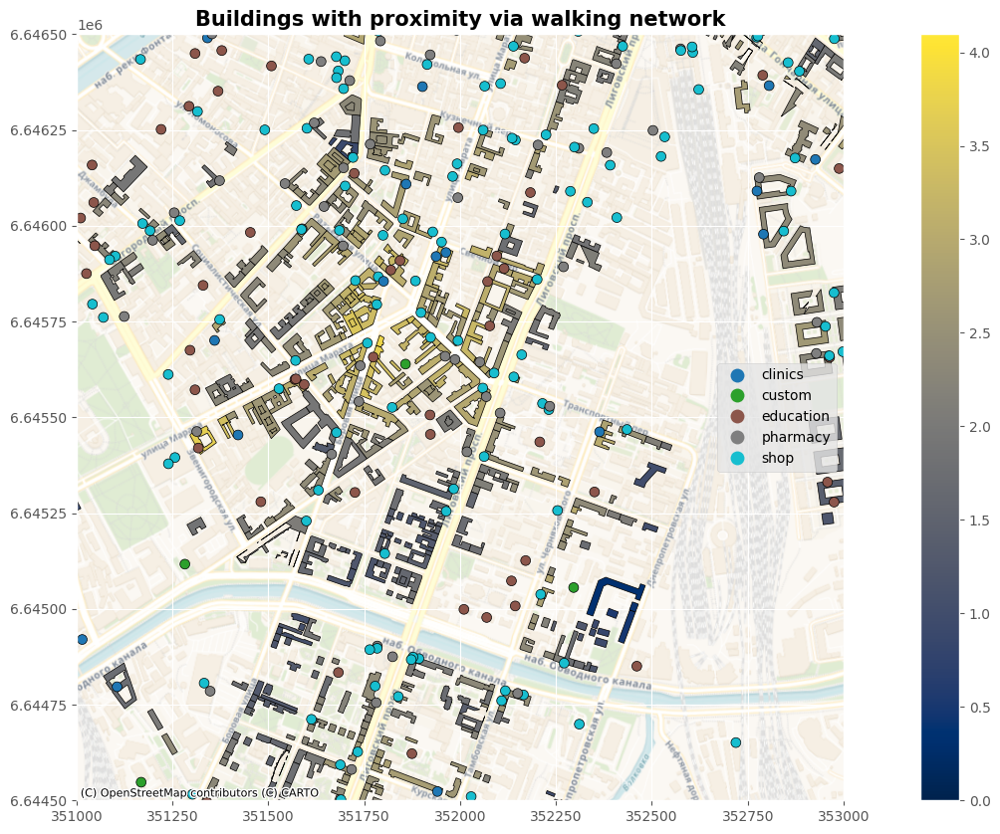

In [93]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='proximity', legend=True, edgecolor='black', alpha=1, cmap='cividis')
  ax = pois.plot(ax=ax, column='pois_cat', legend=True, markersize=50, edgecolor='black')
  plt.setp(ax, xlim=(351000, 353000), ylim=(6644500, 6646500))
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with proximity via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_proximity_via_{network_type}_network_zoom_extra_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with proximity to {fp}')
  plt.show()

INFO:root:save buildings with obj indicator to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_obj_via_walking_network_2024_05_06.png


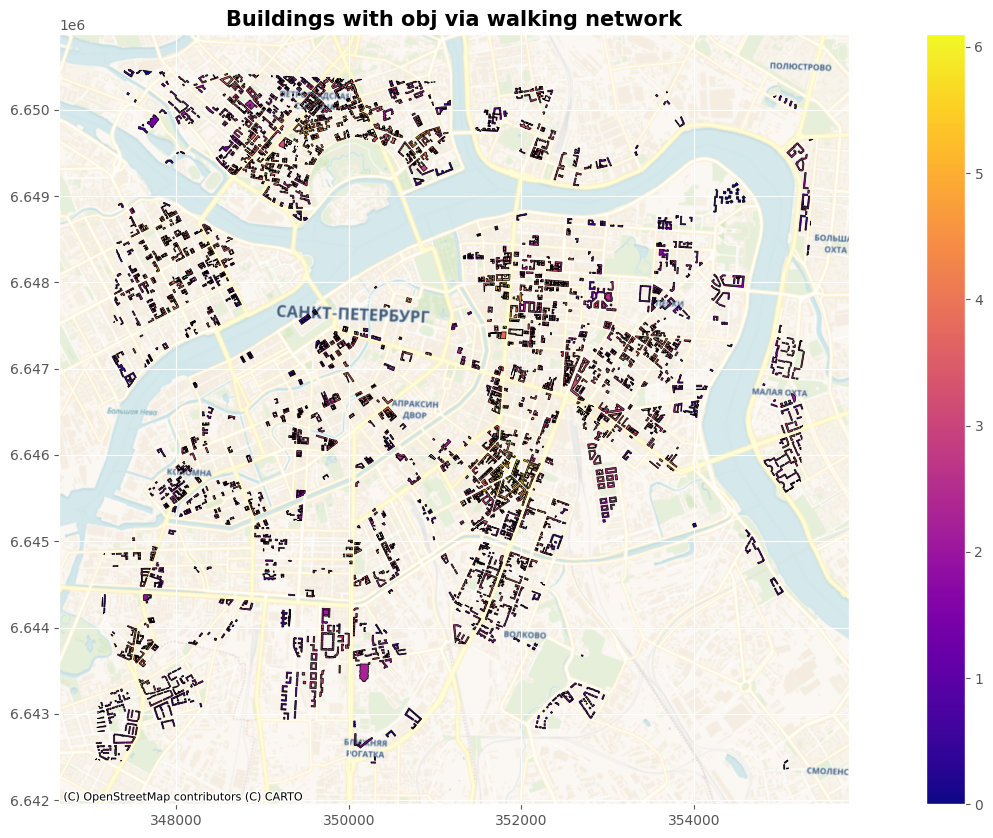

In [94]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='obj', legend=True, edgecolor='black', alpha=1, cmap='plasma')
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with obj via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_obj_via_{network_type}_network_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with obj indicator to {fp}')
  plt.show()

INFO:root:save buildings with obj indicator to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_obj_via_walking_network_zoom_2024_05_06.png


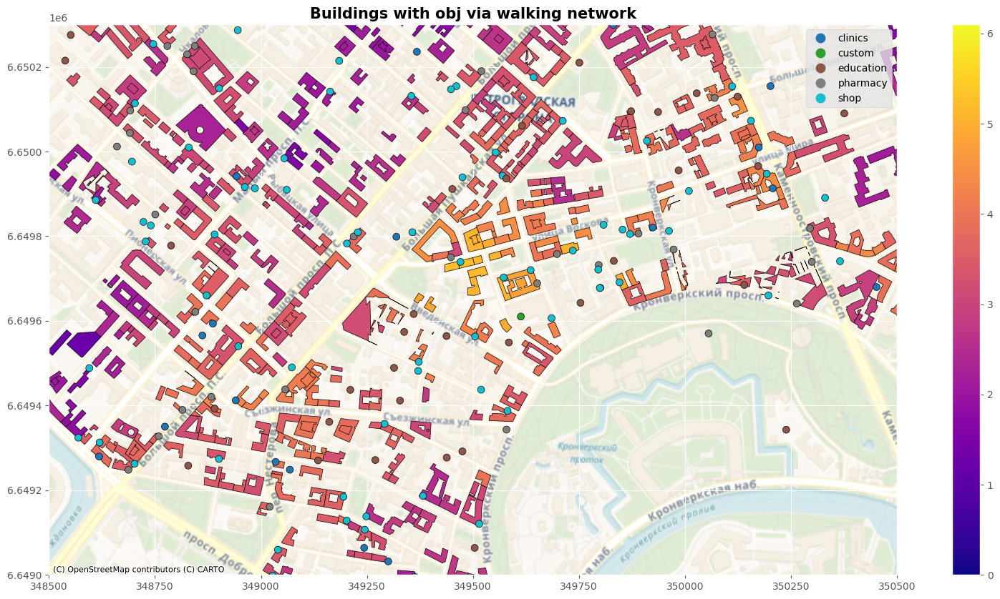

In [95]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='obj', legend=True, edgecolor='black', alpha=1, cmap='plasma')
  ax = pois.plot(ax=ax, column='pois_cat', legend=True, markersize=50, edgecolor='black')
  plt.setp(ax, xlim=(348500, 350500), ylim=(6649000, 6650300))
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with obj via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_obj_via_{network_type}_network_zoom_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with obj indicator to {fp}')
  plt.show()

INFO:root:save buildings with obj indicator to /content/drive/MyDrive/vkr/kmu/src/osm/images/buildings_with_obj_via_walking_network_zoom_extra_2024_05_06.png


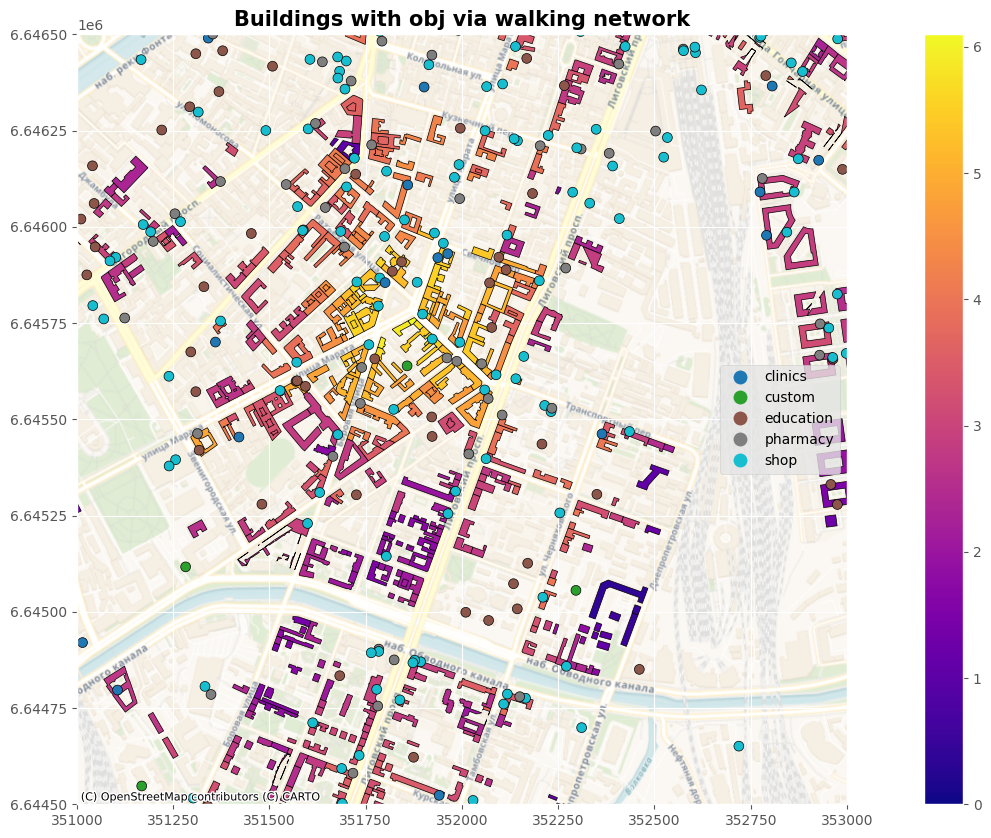

In [98]:
import contextily as cx
from matplotlib import pyplot as plt
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

with plt.style.context("ggplot"):
  ax = buildings_with_obj_metrics.plot(figsize=(20, 10), column='obj', legend=True, edgecolor='black', alpha=1, cmap='plasma')
  ax = pois.plot(ax=ax, column='pois_cat', legend=True, markersize=50, edgecolor='black')
  plt.setp(ax, xlim=(351000, 353000), ylim=(6644500, 6646500))
  cx.add_basemap(ax=ax, crs=buildings.crs.to_string(), source=cx.providers.CartoDB.Voyager)
  ax.set_title(f'Buildings with obj via {network_type} network', fontsize=15, fontweight='bold')
  fp = config['dir_osm']+f'images/buildings_with_obj_via_{network_type}_network_zoom_extra_'+start+'.png'
  plt.savefig(fp, bbox_inches='tight')
  logger.info(f'save buildings with obj indicator to {fp}')
  plt.show()

In [102]:
import datetime

start = datetime.datetime.today().strftime("%Y_%m_%d")

fp = ''
if 'bbox' in config:
  fp = config['dir_osm'] + 'spb_bbox_' + start + '.gpkg'
  buildings_with_obj_metrics.to_file(fp, driver='GPKG', layer='buildings_with_objective_metrics', encoding='utf-8')
  logger.info(f'save buildings with objective metrics to {fp}')
else:
  fp = config['dir_osm'] + 'spb_' + start + '.gpkg'
  buildings_with_obj_metrics.to_file(fp, driver='GPKG', layer='buildings_with_objective_metrics', encoding='utf-8')
  logger.info(f'save buildings with objective metrics to {fp}')

INFO:root:save buildings with objective metrics to /content/drive/MyDrive/vkr/kmu/src/osm/spb_bbox_2024_05_06.gpkg


In [103]:
from geopandas import read_file

buildings_from_gpkg = read_file(fp, layer='buildings_with_objective_metrics')

if buildings_with_obj_metrics.shape[0] == buildings_from_gpkg.shape[0] and buildings_with_obj_metrics.crs == buildings_from_gpkg.crs:
  logger.info(f'buildings with objective metrics successfully loaded from gpkg')

INFO:root:buildings with objective metrics successfully loaded from gpkg


In [104]:
buildings_from_gpkg.head(2)

,id,building,levels,country,city,street,housenumber,osm_type,centroid_x,centroid_y,node_id,access_sum,k_div_access,accessibility,proximity,obj,geometry
0,22967564,apartments,5,RU,Санкт-Петербург,Кронверкский проспект,63/31,way,349568.604639,6.649377e+06,1.058809e+10,1.451756,0.8,1.161405,2.593460,3.754865,"POLYGON ((349578.732 6649376.838, 349577.244 6..."
1,23088593,apartments,5,RU,Санкт-Петербург,улица Стахановцев,9,way,355125.226808,6.646045e+06,2.162657e+07,0.450850,0.8,0.360680,2.103516,2.464196,"POLYGON ((355124.500 6646068.154, 355127.464 6..."
